# Pipeline for Vehicle Identification and Localization (PipeVIaL)


The Pipeline for Vehicle Identification and Localization (PipeVIaL) implements a solution to Project 5 of Udacity's Self-Driving Car Engineer nanodegree – namely, detection and tracking of vehicles in a video recorded from a front-mounted camera on a car traveling down a road. It works by performing the following operations on video image frames:

1. Compute a Histogram of Oriented Gradients (HOG) from an input image;
2. Use a trained classifier to determine the likelihood that extracted image sections (represented as HOG blocks) depict a vehicle;
3. 

---

## 1. Basic Setup

We start by defining some basic operations. In order to load training images from disk, we implement a function that takes a path expression as input and returns a list of paths to existing files that match the expression, and another that loads images from file. We also define some shortcuts to common operations:

In [1]:
from glob import glob

import cv2
import numpy as np


# Basic colors in BGR format.
BGR_BLUE = (255, 0, 0)
BGR_GREEN = (0, 255, 0)
BGR_RED = (0, 0, 255)


def find_images(*path_expressions):
    r'''Return a lexicographically sorted list of paths matching the given expressions.
    '''
    paths = sum((glob(path_expression) for path_expression in path_expressions), [])
    paths.sort() # Sort paths lexicographically for more predictable results
    return paths


def load_image(path, shape=None):
    r'''Load the image from the file at the given path.
    
        If the `shape` argument is given, resize the image to the given dimensions.
    '''
    image = cv2.imread(path)
    return image if shape == None else resize(image, shape)


def save_image(path, image):
    r'''Save image to the given path.
    '''
    cv2.imwrite(path, image)


def resize(image, shape, **kwargs):
    r'''Resize image to given shape.
    
        *Arguments:*
        
        `shape`
            Shape of the resized image, specified as a 2-tuple `(m, n)` where
            `m` is the row count and `n` the column count.
        
        *Returns*
        
        The original image resized to the given shape.
    '''
    return cv2.resize(image, shape[::-1], **kwargs)


def grayscale(bgr):
    r'''Convert the given BGR image to grayscale.
    '''
    return cv2.cvtColor(bgr, cv2.COLOR_BGR2GRAY)


class Size(tuple):
    r'''Image dimensions in OpenCV style.
    '''
    def __new__(cls, image):
        return tuple.__new__(cls, image.shape[:2][::-1])
    
    @property
    def width(self):
        return self[0]
    
    @property
    def height(self):
        return self[1]
    
    
def prod(*args):
    r'''Return the product of its arguments.
    '''
    if len(args) == 1:
        args = args[0]

    total = 1
    for value in args:
        total *= value

    return total

It's often enlightening to see the results of operations an image processing system applies to its inputs. The code below makes it easy to display several images side by side in a row:

In [2]:
import matplotlib.pyplot as plt
%matplotlib inline


# Widen the page region used for plots
plt.rcParams['figure.figsize'] = (12.0, 4.0) # Otiginal: (6.0, 4.0)


def display_image(j, n, image, colorspace, ticks):
    r'''Add a single image of given colorspace to subplot `j` of a plot with `n` cells.
    '''
    plotter = plt.subplot2grid((1, n), (0, j))

    if type(image) == tuple:
        (X, Y) = image
        return plotter.plot(X, Y, colorspace)

    if colorspace == 'CV':
        channels = image.shape[2] if len(image.shape) > 2 else 1
        if channels == 1:
            return display_image(j, n, image, 'L', ticks)
        elif channels == 3:
            return display_image(j, n, image, 'BGR', ticks)
        else:
            raise Exception('Cannot display image with %d channels' % channels)

    if colorspace == 'BGR':
        plotter.imshow(image[:, :, ::-1])
    elif colorspace == 'L':
        plotter.matshow(image, cmap=plt.cm.gray)
    else: # colorspace == 'RGB'
        plotter.imshow(image)

    if not ticks:
        plotter.set_xticks([])
        plotter.set_yticks([])


def display(*images, **kwargs):
    r'''Display one or more images of a given colorspace side-by-side on a row.
    
        Arguments:
        
        `images`
            One or more images for display.
            
        `colorspace`
            Keyword argument. Images' colorspace. Possible values:
            
            * `CV` - Automatically selects `BGR` or `L` depending on the number of channels
            * `BGR` - OpenCV Blue, Green, Red (BGR) color image
            * `L` - grayscale image
            * `RGB` - Color image
            
            Default is `CV`.
            
        `ticks`
            Keyword argument. Whether to display ticks on the axes of the plot. Default is `False`.
    '''
    colorspace = kwargs.get('colorspace', 'CV')
    ticks = kwargs.get('ticks', False)
    
    n = len(images)
    for (j, image) in enumerate(images):
        display_image(j, n, image, colorspace, ticks)
        
    plt.show()

Later on the project we'll need to load and process video inputs. The code below provides conveniences for editting and displaying videos:

In [3]:
from os.path import splitext
from time import time
from moviepy.editor import VideoFileClip
from IPython.display import HTML


# Template HTML snippet for embedding a video display into the notebook.
class VideoTag(object):
    def __mod__(self, path):
        return r'<video width="960" height="540" controls><source src="%s?t=%d"></video>' % (path, time())

VIDEO_TAG = VideoTag()


def BGR(processor):
    def converter(image):
        bgr = image[:, :, ::-1] # Convert image to BGR
        image = processor(bgr)
        return image[:, :, ::-1] # Convert image back to RGB
    
    return converter


def load_video(path):
    r'''Load the video at the given path.
    '''
    return VideoFileClip(path)


def process_video(video, processor, path):
    r'''Process the given video object, saving the result to the given file path.
    '''
    if isinstance(video, str):
        video = load_video(video)
    
    edited = video.fl_image(BGR(processor))
    # Display processing progress inline.
    %time edited.write_videofile(path, audio=False)
    
    
def process(path):
    (name, ext) = splitext(path)
    process_video(video, binary_image, name + '_binary_map' + ext)
    process_video(video, LaneDetector(video.size), name + '_lane_regression' + ext)
    process_video(video, PipeAdLR(video.size), name + '_annotated' + ext)

The algorithms we are going to implement require a fiar number of parameters to be set, and it's easy to lost track of how many there are or where they are used. To make the situation explicit, we define a global object to hold all system parameters:

In [4]:
class Trie(object):
    r'''Dynamic collection of named attributes.
    '''
    def __getattr__(self, name):
        value = Trie()
        object.__setattr__(self, name, value)
        return value


params = Trie()
params.hog.orientations = 64
params.hog.pixels_per_cell = (8, 8)
params.hog.cells_per_block = (8, 8)
params.datasets.batch.size = 50 # Size of training batch, in number of samples
params.datasets.batch.step = 10
params.epochs = 5
params.datasets.train.size = 0.6 # Size of the training dataset, as fraction of total number of available samples
params.datasets.validation.size = 0.3 # Size of the validation dataset, as fraction of total number of available samples
params.window.side = 64

---

## 2. Dataset Setup

PipeVIaL uses a classifier to identify vehicles in video frame images. This classifier must be trained, which in turn requires labelled training data to be available. The code below loads and organizes labelled image data for classifier training:

In [5]:
from random import sample, shuffle


def load_datasets():
    r'''Load the image dataset and partitions it in train, validation and test sets.
    
        Training and validation dataset sizes are given as fractions of total sample number,
        such that `r_train + r_valid < 1.0`, with the remainder composing the test set.
    '''
    # Load vehicle and non-vehicle sample datasets.
    non_vehicles = find_images('data/non-vehicles/*/*.png')
    vehicles = find_images('data/vehicles/*/*.png')

    # Subsample both datasets down to the least common size.
    #k = min(len(non_vehicles), len(vehicles))
    #non_vehicles = sample(non_vehicles, k)
    #vehicles = sample(vehicles, k)
    
    return (non_vehicles, vehicles)

    
def repartition_datasets(non_vehicles, vehicles):
    r'''Repartitions a pair of non-vehicle and vehicle image datasets in train, validation and test sets.
    
        Training and validation dataset sizes are given as fractions of total sample number,
        such that `r_train + r_valid < 1.0`, with the remainder composing the test set.
    '''
    # Label dataset entries.
    non_vehicles = [(path, 0) for path in non_vehicles]
    vehicles = [(path, 1) for path in vehicles]

    
    # Merge both datasets, taking care to ensure a random sample distribution.
    dataset = sum((list(samples) for samples in zip(non_vehicles, vehicles)), [])
    shuffle(dataset)
    
    n = len(dataset)
    n_train = int(n * params.datasets.train.size)
    n_valid = int(n * params.datasets.validation.size)
    a = n_train
    b = n_train + n_valid

    train = dataset[:a]
    valid = dataset[a:b]
    test = dataset[b:]
    
    return (train, valid, test)
    
print('Loading datasets...')
(non_vehicles, vehicles) = load_datasets()

print('Non-vehicle dataset: %d samples.' % len(non_vehicles))
print('Vehicle dataset: %d samples.\n' % len(vehicles))


print('Repartitioning datasets...')
(training, validation, test) = repartition_datasets(non_vehicles, vehicles)

print('Training dataset: %d samples.' % len(training))
print('Validation dataset: %d samples.' % len(validation))
print('Test dataset: %d samples.' % len(test))

Loading datasets...
Non-vehicle dataset: 9666 samples.
Vehicle dataset: 8792 samples.

Repartitioning datasets...
Training dataset: 10550 samples.
Validation dataset: 5275 samples.
Test dataset: 1759 samples.


---

It's also convenient to have video frame samples as separate images for experimentation. The code below extracts samples 1s apart from the validation video and saves them to a destination folder:

In [49]:
def extract_samples(path):
    video = load_video('data/project_video.mp4')
    for (i, frame) in enumerate(video.iter_frames()):
        if i % 25 == 0:
            save_image(path % i, frame[:, :, ::-1])


extract_samples('data/project_video_frames/frame%05d.png')

## 3. Feature Extraction

In order to make effective classifier training possible, features that encode relevant visual information for distinguishing between vehicle and non-vehicla images must be computed. The [Histogram of Oriented Gradients (HOG)](https://en.wikipedia.org/wiki/Histogram_of_oriented_gradients) is a feature descriptor useful for object identification tasks. The [scikit-image](http://scikit-image.org/) library provides an [implementation](http://scikit-image.org/docs/dev/api/skimage.feature.html#skimage.feature.hog) that enables several feature parameters to be set. The code below provides a shortcut for computing the HOG of an image with sensible default settings:

In [6]:
from skimage.feature import hog


def HOG(image, visualization=False):
    r'''Compute the Histogram of Oriented Gradients (HOG) for the given input image.
    
        Arguments:
        
        `image`
            A grayscale or BGR image (which is converted to grayscale prior to computation).
            
        `visualization`
            It `True`, a tuple `(hog, img)` is returned, where `img` is a grayscale image represenation of the HOG `hog`.
            Otherwise, only `hog` is returned.
            
        Returns:
        
        Either a HOG or a tuple `(hog, img)`, as explained above.
    '''
    grays = image if len(image.shape) == 2 else grayscale(image)

    return hog(grays,
        orientations=params.hog.orientations,
        pixels_per_cell=params.hog.pixels_per_cell,
        cells_per_block=params.hog.cells_per_block,
        visualise=visualization,
        transform_sqrt=True,
        feature_vector=False
    )

In [ ]:
image = load_image(vehicles[0])
features = HOG(image)
print(features.shape)
features -= features.mean()
#features /= np.abs(features).max()
features /= features.std()
print(features.max())
print(features.min())
print(features.mean())
print(features.std())


The code below shows the effect of extracting HOG features from some images. Vehicle and non-vehicle samples are alternately displayed along with their HOG's to illustrate the differences between the two classes:

('data/vehicles/GTI_MiddleClose/image0215.png', 'data/non-vehicles/GTI/image3017.png', 'data/vehicles/KITTI_extracted/4991.png', 'data/non-vehicles/Extras/extra2783.png', 'data/vehicles/KITTI_extracted/4206.png')


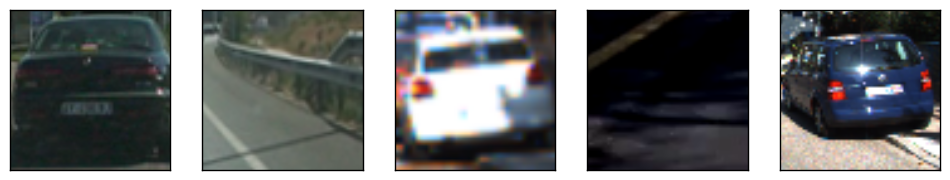

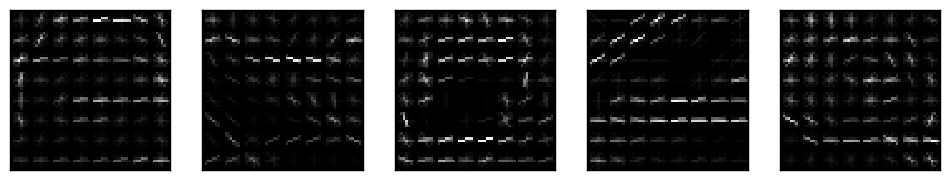

('data/non-vehicles/GTI/image2320.png', 'data/vehicles/KITTI_extracted/2240.png', 'data/non-vehicles/Extras/extra3391.png', 'data/vehicles/KITTI_extracted/1627.png', 'data/non-vehicles/GTI/image3259.png')


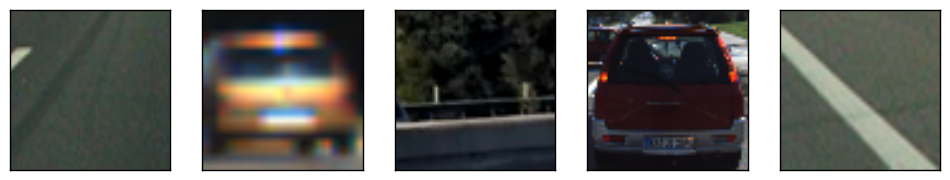

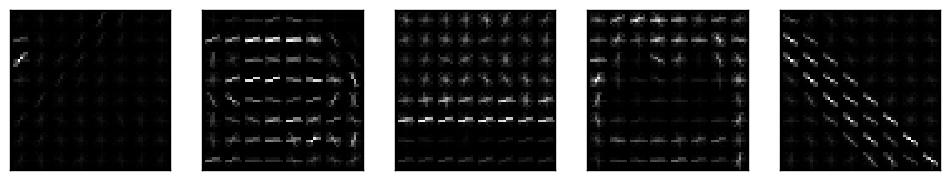

('data/vehicles/KITTI_extracted/1654.png', 'data/non-vehicles/Extras/extra2673.png', 'data/vehicles/KITTI_extracted/5818.png', 'data/non-vehicles/Extras/extra2697.png', 'data/vehicles/KITTI_extracted/2109.png')


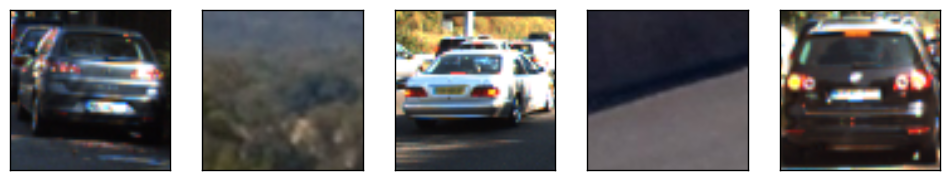

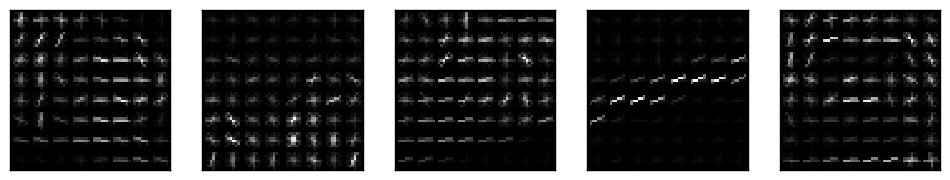

('data/non-vehicles/GTI/image3533.png', 'data/vehicles/KITTI_extracted/4969.png', 'data/non-vehicles/GTI/image2242.png', 'data/vehicles/KITTI_extracted/2000.png', 'data/non-vehicles/Extras/extra3755.png')


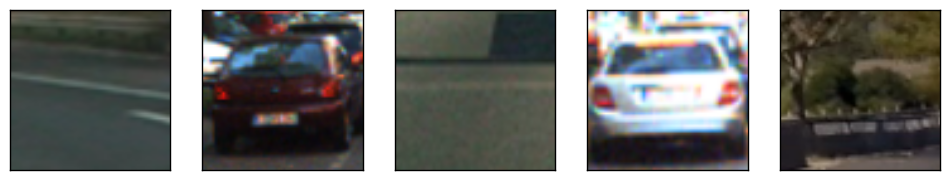

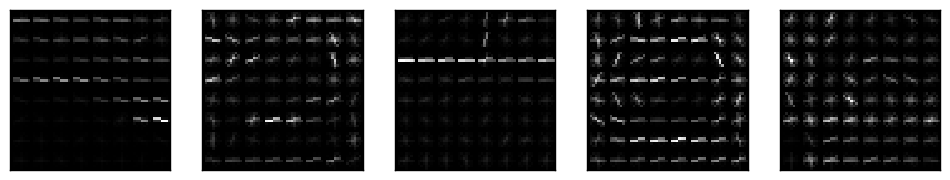

('data/vehicles/GTI_Right/image0815.png', 'data/non-vehicles/Extras/extra5161.png', 'data/vehicles/GTI_Right/image0822.png', 'data/non-vehicles/Extras/extra2243.png', 'data/vehicles/KITTI_extracted/1580.png')


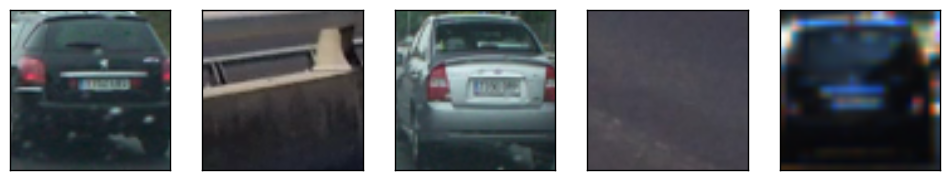

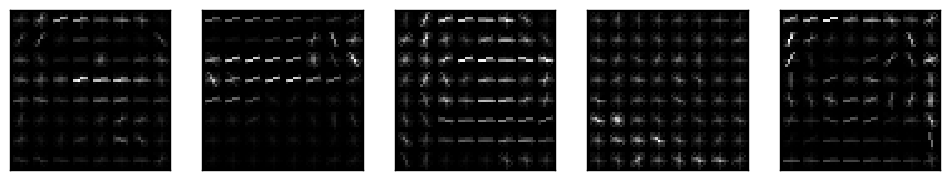

('data/non-vehicles/GTI/image1056.png', 'data/vehicles/GTI_Left/image0211.png', 'data/non-vehicles/Extras/extra2168.png', 'data/vehicles/KITTI_extracted/4484.png', 'data/non-vehicles/Extras/extra1558.png')


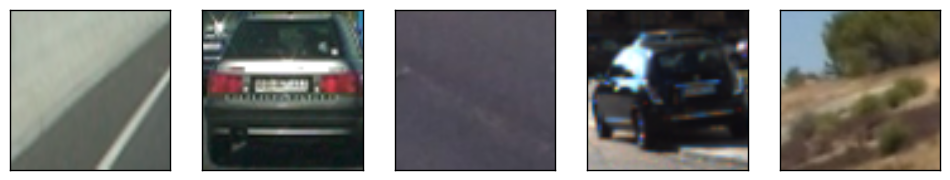

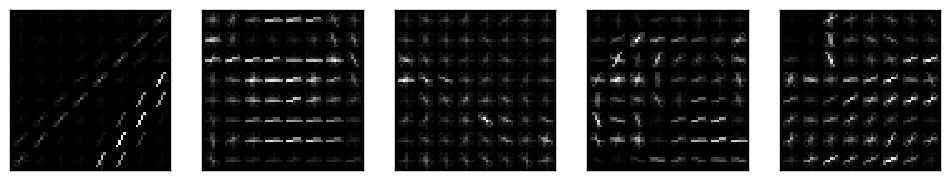

('data/vehicles/KITTI_extracted/5484.png', 'data/non-vehicles/GTI/image1795.png', 'data/vehicles/GTI_Left/image0246.png', 'data/non-vehicles/Extras/extra4357.png', 'data/vehicles/GTI_Right/image0484.png')


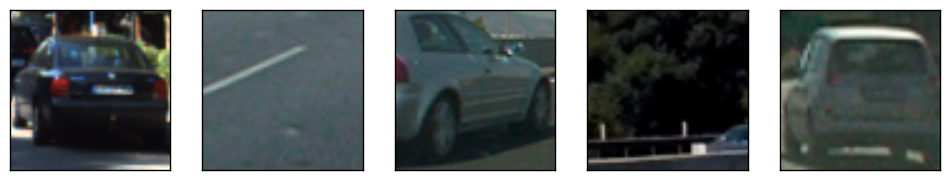

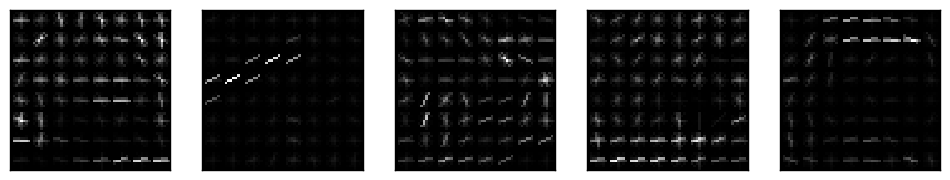

('data/non-vehicles/Extras/extra3160.png', 'data/vehicles/KITTI_extracted/3763.png', 'data/non-vehicles/Extras/extra5362.png', 'data/vehicles/GTI_Left/image0285.png', 'data/non-vehicles/GTI/image98.png')


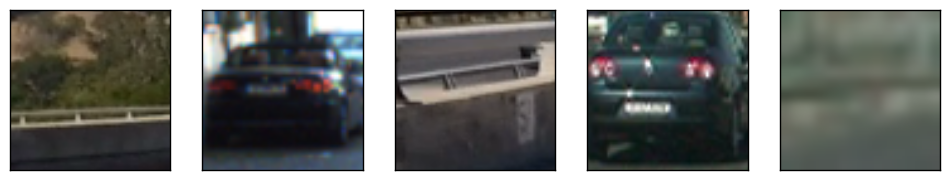

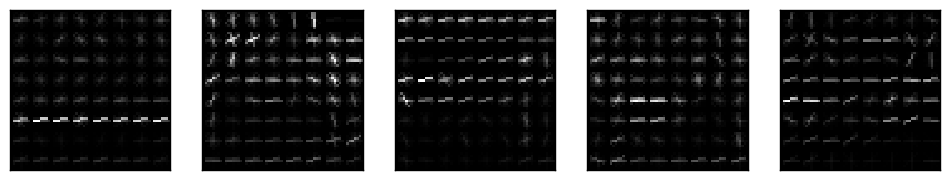

('data/vehicles/KITTI_extracted/2131.png', 'data/non-vehicles/Extras/extra3942.png', 'data/vehicles/GTI_Left/image0130.png', 'data/non-vehicles/GTI/image1319.png', 'data/vehicles/KITTI_extracted/2891.png')


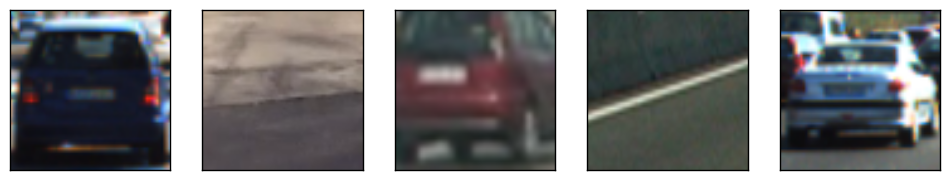

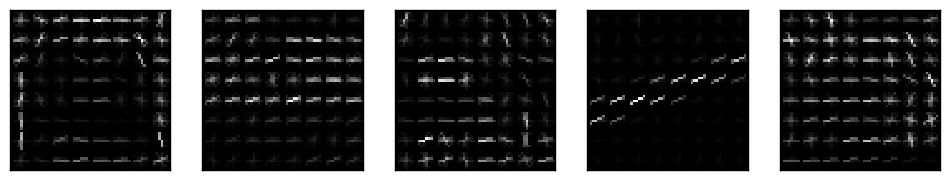

('data/non-vehicles/GTI/image441.png', 'data/vehicles/KITTI_extracted/4325.png', 'data/non-vehicles/Extras/extra4902.png', 'data/vehicles/GTI_MiddleClose/image0251.png', 'data/non-vehicles/Extras/extra1398.png')


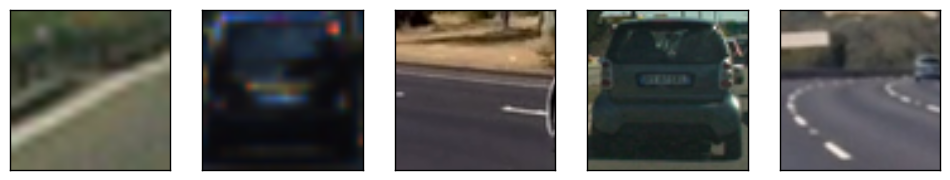

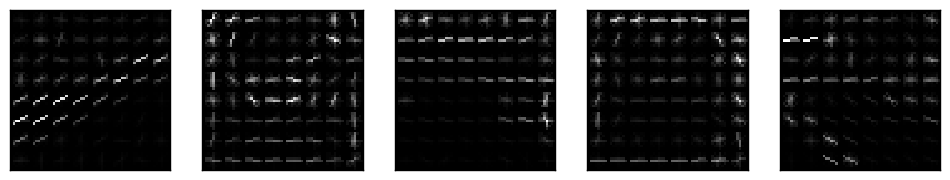

('data/vehicles/GTI_Left/image0082.png', 'data/non-vehicles/GTI/image3161.png', 'data/vehicles/GTI_Right/image0441.png', 'data/non-vehicles/Extras/extra1698.png', 'data/vehicles/KITTI_extracted/4239.png')


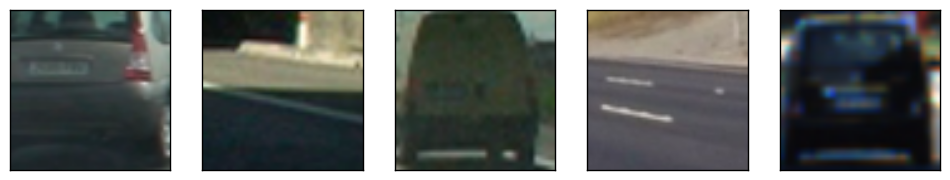

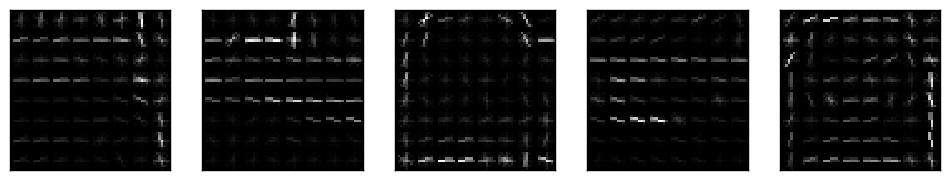

('data/non-vehicles/Extras/extra3454.png', 'data/vehicles/KITTI_extracted/3400.png', 'data/non-vehicles/Extras/extra3069.png', 'data/vehicles/KITTI_extracted/1085.png', 'data/non-vehicles/Extras/extra2126.png')


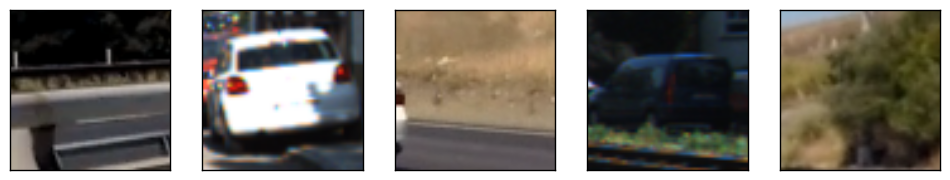

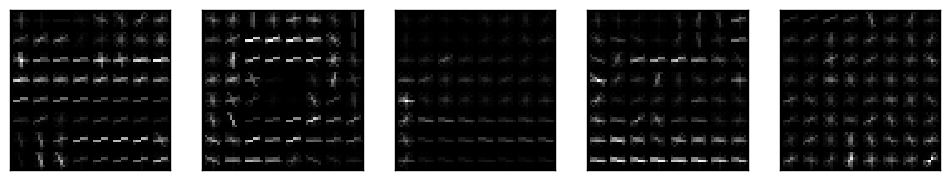

('data/vehicles/KITTI_extracted/3574.png', 'data/non-vehicles/GTI/image2186.png', 'data/vehicles/KITTI_extracted/1943.png', 'data/non-vehicles/Extras/extra2263.png', 'data/vehicles/KITTI_extracted/3034.png')


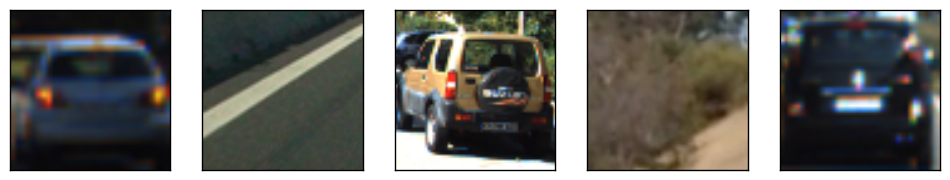

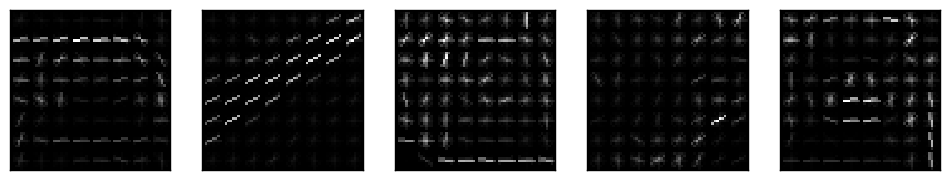

('data/non-vehicles/GTI/image224.png', 'data/vehicles/KITTI_extracted/320.png', 'data/non-vehicles/Extras/extra802.png', 'data/vehicles/KITTI_extracted/4979.png', 'data/non-vehicles/Extras/extra1010.png')


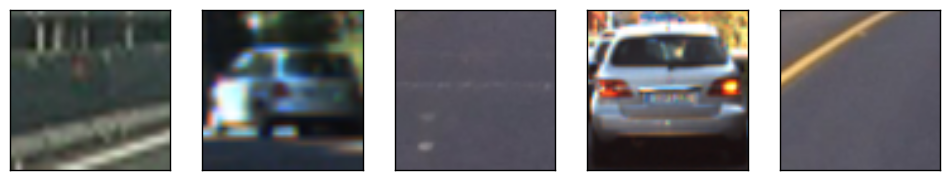

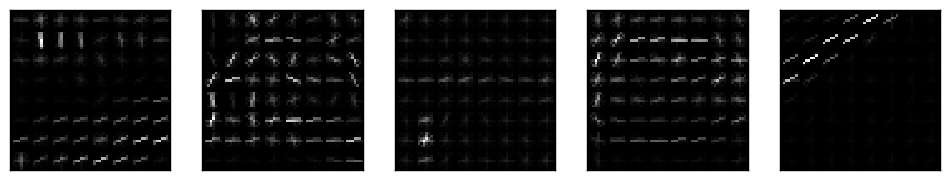

('data/vehicles/KITTI_extracted/2104.png', 'data/non-vehicles/Extras/extra1426.png', 'data/vehicles/GTI_Far/image0763.png', 'data/non-vehicles/GTI/image996.png', 'data/vehicles/KITTI_extracted/212.png')


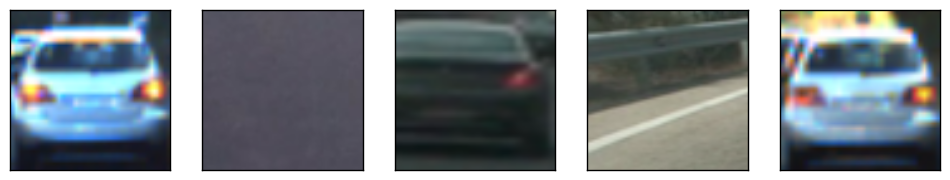

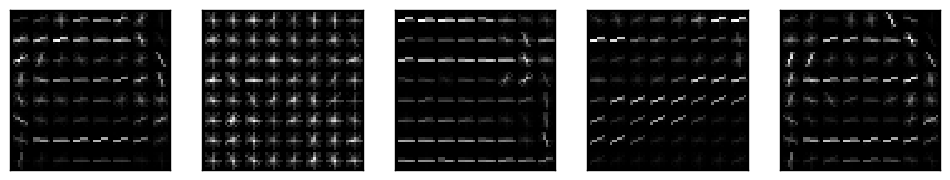

('data/non-vehicles/Extras/extra4370.png', 'data/vehicles/KITTI_extracted/4162.png', 'data/non-vehicles/Extras/extra3888.png', 'data/vehicles/GTI_MiddleClose/image0222.png', 'data/non-vehicles/GTI/image248.png')


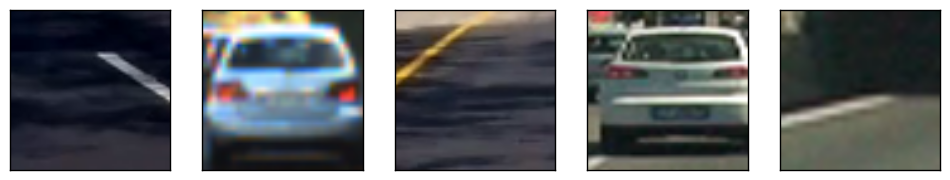

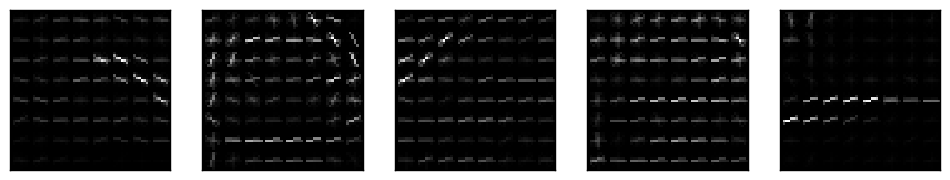

('data/vehicles/GTI_MiddleClose/image0174.png', 'data/non-vehicles/Extras/extra5435.png', 'data/vehicles/GTI_Right/image0127.png', 'data/non-vehicles/GTI/image817.png', 'data/vehicles/GTI_Far/image0170.png')


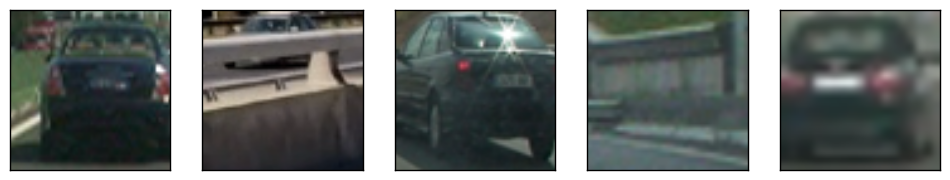

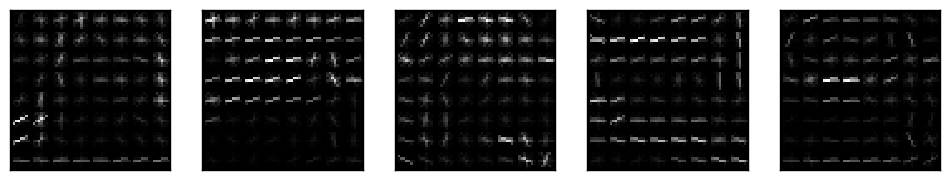

('data/non-vehicles/Extras/extra807.png', 'data/vehicles/KITTI_extracted/2900.png', 'data/non-vehicles/GTI/image3473.png', 'data/vehicles/KITTI_extracted/4400.png', 'data/non-vehicles/Extras/extra5168.png')


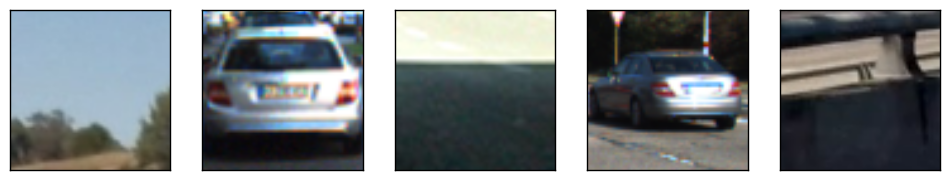

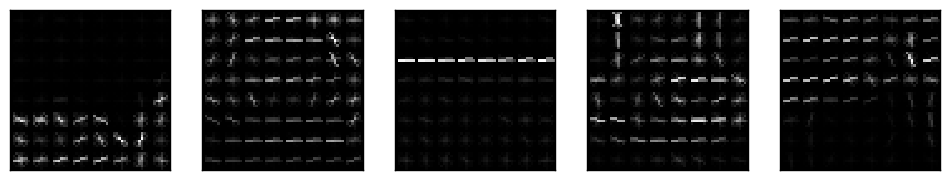

('data/vehicles/KITTI_extracted/92.png', 'data/non-vehicles/GTI/image1671.png', 'data/vehicles/GTI_Left/image0430.png', 'data/non-vehicles/Extras/extra2936.png', 'data/vehicles/KITTI_extracted/4337.png')


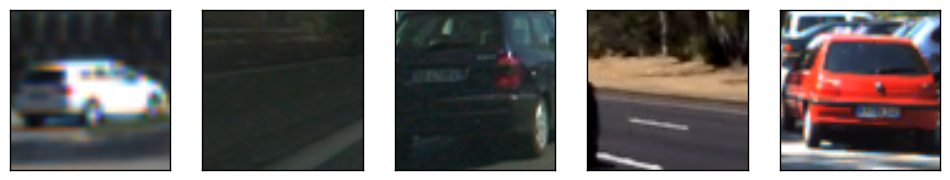

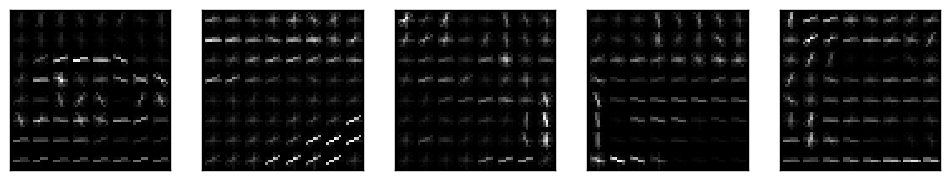

In [6]:
def display_hog():
    paths_non_vehicles = non_vehicles[:50]
    paths_vehicles = vehicles[:50]
    
    paths = sum((pair for pair in zip(paths_vehicles, paths_non_vehicles)), tuple())

    r = range(0, len(paths), 5)
    for (a, b) in zip(r[:-1], r[1:]):
        path_batch = paths[a:b]
        images = [load_image(path) for path in path_batch]
        hog_imgs = [HOG(image, True)[1] for image in images]
        print(path_batch)
        display(*images)
        display(*hog_imgs)

display_hog()

---

HOG computation is controlled by three parameters, `orientations`, `pixels_per_cell` and `cells_per_block`. We are interested in parameter sets that make vehicle and non-vehicle as different from each other as possible (i.e. maximize interclass distance) and images from each set as alike as possible (minimize intraclass distance). For this purpose we implement a simple grid search over the space of HOG parameters, using the interclass / intraclass distance ratio as the optimized value. Block size is set to always cover all cells inside a window, for reasons that will become clear in section 4.

In [ ]:
from itertools import product

from tqdm import tqdm


def hog_distance_ratio(non_vehicles, vehicles, orientations, pixels_per_cell, cells_per_block):
    def feature_vector(path):
        image = load_image(path)
        grays = grayscale(image)
        vector = hog(grays,
            orientations=orientations,
            pixels_per_cell=pixels_per_cell,
            cells_per_block=cells_per_block,
            transform_sqrt=True
        )
        
        vector -= vector.mean()

        s = vector.std()
        if s != 0:
            vector /= s

        return vector
    
    desc = 'orientations = %2d, cell side = %2d, block side = %2d' % (
        orientations, pixels_per_cell[0], cells_per_block[0]
    )

    counter = tqdm(range(len(vehicles) - 1), desc=desc, unit='steps')
    def features():
        hog_n1 = feature_vector(non_vehicles[0])
        hog_v1 = feature_vector(vehicles[0])
        hog_n2 = None
        hog_v2 = None
        
        for (k, n2, v2) in zip(counter, non_vehicles[1:], vehicles[1:]):
            hog_n2 = feature_vector(n2)
            hog_v2 = feature_vector(v2)
            yield (hog_n1, hog_n2, hog_v1, hog_v2)
            hog_n1 = hog_n2
            hog_v1 = hog_v2
    
    d_inter = 0.0
    d_intra = 0.0
    for (hog_n1, hog_n2, hog_v1, hog_v2) in features():
        d_inter += np.dot(hog_n1, hog_v2)
        d_inter += np.dot(hog_n2, hog_v1)

        d_intra += np.dot(hog_n1, hog_n2)
        d_intra += np.dot(hog_v1, hog_v2)
    
    return d_intra / d_inter if d_inter != 0 else 0.0

def grid_search_hog():
    r_orientations = range(8, 17)
    r_cell_side = range(2, 9)

    max_ratio = 0    
    for (cell_side, orientations) in product(r_cell_side, r_orientations):
        block_side = params.window.side // cell_side
        pixels_per_cell = (cell_side, cell_side)
        cells_per_block = (block_side, block_side)

        k = 2001
        non_vehicles_k = sample(non_vehicles, k)
        vehicles_k = sample(vehicles, k)

        d_ratio = hog_distance_ratio(non_vehicles_k, vehicles_k, orientations, pixels_per_cell, cells_per_block)
        if d_ratio > max_ratio:
            params.hog.orientations = orientations
            params.hog.pixels_per_cell = pixels_per_cell
            params.hog.cells_per_block = cells_per_block
            max_ratio = d_ratio


grid_search_hog()
print('Best values:')
print(
    'orientations = %d, cell side = %d, block side = %d' % (
        params.hog.orientations,
        params.hog.pixels_per_cell[0],
        params.hog.cells_per_block[0]
    )
)

## 4. Classifier Training

THe HOG's from vehicle and non-vehicle images are used to train a classifier for the two classes. In order to keep memory requirements down, a [SGDClassifier](http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html) (which performs stochastic gradient descent on a Support Vector Machine) was trained using mini-batches extracted from the training dataset. We begin by loading, randomizing and spliting the dataset in training, validation and test sections:

---

Next functions to generate batches from datasets and train a classifier with them are implemented:

In [7]:
from math import ceil, floor
from random import shuffle
from sys import maxsize

from tqdm import tqdm


def extract_features(image):
    features = HOG(image)
    features -= features.mean()
    features /= features.std()
    return features.ravel()


def batches(dataset, counter=range):
    l = params.datasets.batch.size
    n = int(ceil(len(dataset) / l)) # Ensures a final "rest" batch will be issued as appropriate
    for k in counter(n):
        a = k * l
        b = a + l
        batch = dataset[a:b]

        features = []
        labels = []
        for (path, label) in batch:
            image = load_image(path)
            features.append(extract_features(image))
            labels.append(label)

        yield (k, np.array(features), np.int32(labels))

        
def accuracy(model, training, validation):
    def average(dataset):
        total = 0.0
        count = 0.0
        for (k, X, Y) in batches(dataset):
            total += np.sum(model.predict(X) == Y)
            count += len(X)

        return total / count
    
    return (
        average(training),
        average(validation)
    )


def plot_lines(title, x, *ys, **kwargs):
    y_min = maxsize
    y_max = -maxsize

    plotter = plt.subplot(111)
    for (y, c, l) in ys:
        label = '%s (last: %.3f)' % (l, round(y[-1], 3))
        plotter.plot(x, y, c, label=label)
        y_min = min(floor(np.min(y)), y_min)
        y_max = max(ceil(np.max(y)), y_max)

    print(y_min, y_max)
        
    plotter.set_title(title)
    plotter.set_xlim([x[0], x[-1]])
    plotter.set_ylim([y_min, y_max])
    plotter.legend(loc=kwargs.get('loc', 1))
    plt.tight_layout()
    plt.show()


def train(model, training, validation):
    batch_step = params.datasets.batch.step
    epochs = params.epochs

    x_batch = []
    y_train = []
    y_valid = []

    for i in range(epochs):
        shuffle(training)
        counter = lambda n: tqdm(range(n), desc='Epoch {:>2}/{}'.format(i + 1, epochs), unit='batches')
        for (k, Xk, Yk) in batches(training, counter):
            model.partial_fit(Xk, Yk, classes=[0, 1])

            if k % batch_step == 0:
                (yk_train, yk_valid) = accuracy(model, training, validation)
                x_batch.append(len(x_batch) * batch_step)
                y_train.append(yk_train)
                y_valid.append(yk_valid)

        plot_lines('Accuracy', x_batch,
            (y_train, 'r', 'Training Accuracy'),
            (y_valid, 'b', 'Validation Accuracy'),
            loc=4
        )

Now it's possible to train the classifier:

Epoch  1/5: 100%|██████████| 211/211 [13:10<00:00,  4.73s/batches]


0 1


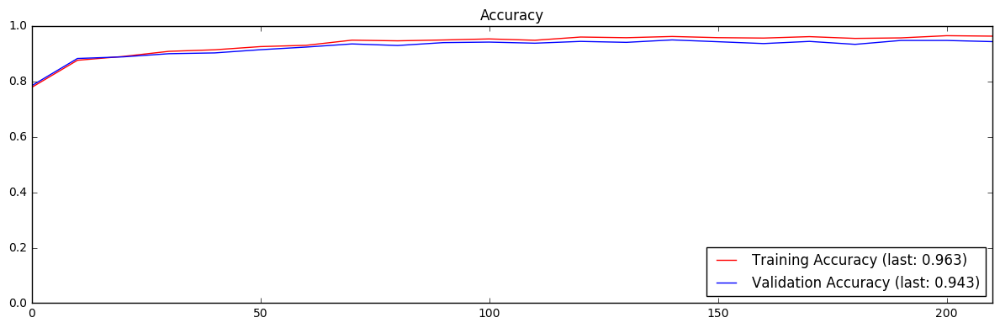

Epoch  2/5: 100%|██████████| 211/211 [11:06<00:00,  5.45s/batches]


0 1


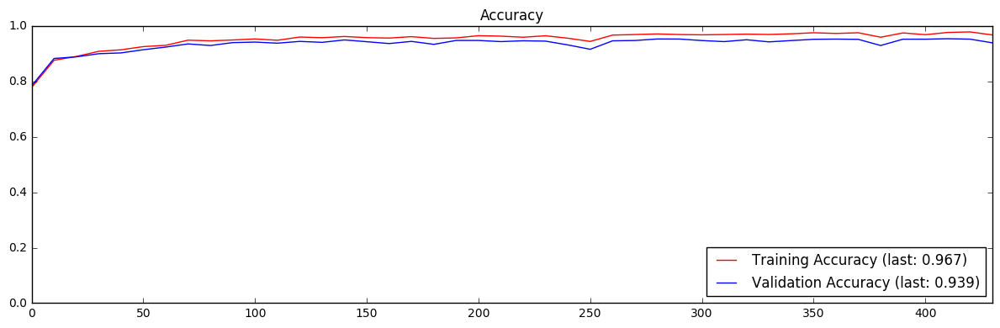

Epoch  3/5: 100%|██████████| 211/211 [11:00<00:00,  5.25s/batches]


0 1


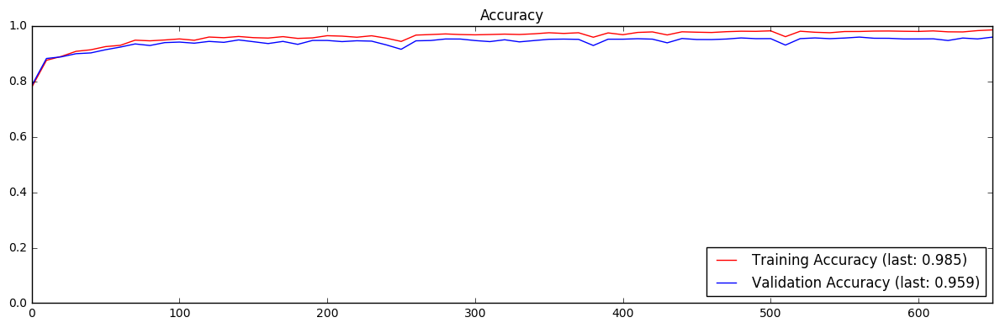

Epoch  4/5: 100%|██████████| 211/211 [11:17<00:00,  5.26s/batches]


0 1


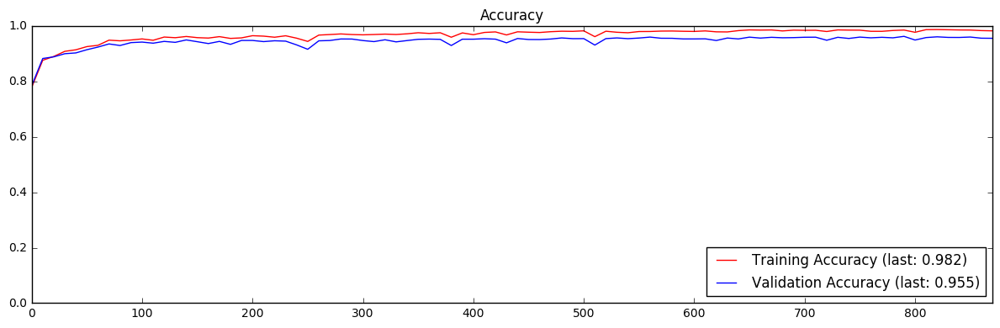

Epoch  5/5: 100%|██████████| 211/211 [11:30<00:00, 11.78s/batches]


0 1


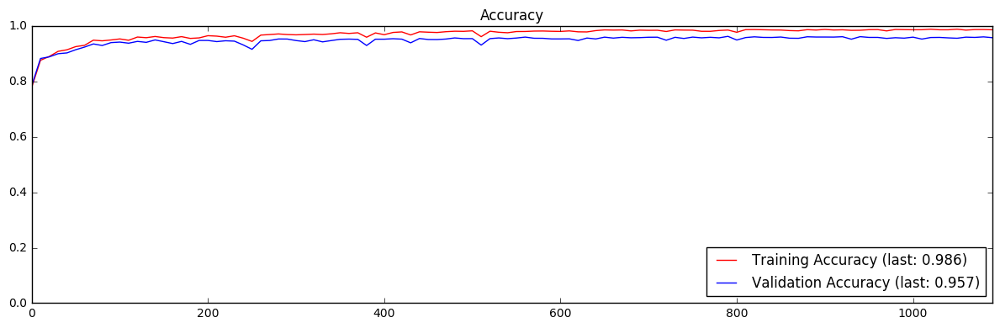

In [8]:
from sklearn.linear_model import SGDClassifier

#model = SGDClassifier(learning_rate='constant', eta0=0.001)
model = SGDClassifier(alpha=0.1)
train(model, training, validation)

## 5. Image Search

Conventionally, in order to use the classifier trained above to identify vehicles across a larger input image, a sliding window of the same size as the training cases would be used to extract image sections, have their HOG features indivdually extracted then submitted to the classifier. However, since we set the HOG's block size parameter to conver all cells inside a window, a much simpler alternative becomes available: extract HOG features for the whole HOG image at once, then take each block (which in the multidimensional representation can be done trivially, by indexing the first two dimensions of the HOG array) as an input feature vector to the classifier. This approach has the added advantage of making the HOG's cell size parameter also work as the step parameter for the (now all but abstracted away) sliding window.

Similarly, muti-scale window sliding can be more easily implemented by working it backwards: instead of using multiple window sizes to extract then individually resize image sections, the whole image can be resized to multiple scales, then the approach above applied to each scaled image.

The code below implements the approach above to compute a likelihood map for an nput image, where the value of each pixel represents the likelihood it contains part of a vehicle.

In [9]:
class Identifier(object):
    def __init__(self, model, *windows):
        self.model = model
        self.windows = [IdentifierWindow(model, a, b, s) for (a, b, s) in windows]

    def __call__(self, bgr):
        return [window(bgr) for window in self.windows]


class IdentifierWindow(object):
    def __init__(self, model, a, b, scale):
        self.model = model
        self.roi = slice(a, b)
        self.scale = scale

    def __call__(self, bgr):
        # Compute the feature map for the ROI
        roi = bgr[self.roi]
        features = self.__features(roi)
        
        # Rework the multidimensional feature map into an array of feature vectors
        (m, n, p, q, z) = features.shape
        (I, J) = np.indices((m, n))
        features = features[I.flat, J.flat]
        features.shape = (prod(m, n), prod(p, q, z))
        
        # Normalize feature vectors
        features -= features.mean(axis=1, keepdims=True)
        features /= features.std(axis=1, keepdims=True)
        
        # Compute the likelihood map for the ROI
        likelihoods = self.model.decision_function(features)
        likelihoods /= likelihoods.max()
        likelihoods.shape = (m, n)
        k = (likelihoods > 0)
        likelihoods[~k] = 0

        # Find the coordinates of vehicle patches in the ROI
        (I, J) = np.indices(likelihoods.shape)
        c = params.hog.pixels_per_cell[0]
        I = I[k] * c
        J = J[k] * c
        
        # Compute a heat mask from the coordinates of vehicle patches
        w = params.window.side
        mask = np.zeros(roi.shape[:2], dtype=np.float32)
        for (i, j, v) in zip(I.flat, J.flat, likelihoods[k]):
            m = i + w
            n = j + w
            mask[i:m, j:n] += v
        
        return (self.roi.start, self.roi.stop, mask)
    
    def __features(self, bgr):
        scale = self.scale
        (m, n) = bgr.shape[:2]
        shape = (
            int(m * scale),
            int(n * scale)
        )

        resized = resize(bgr, shape, interpolation=cv2.INTER_NEAREST)
        return HOG(resized)

The code below shows the results of applying the identifier to sample images:

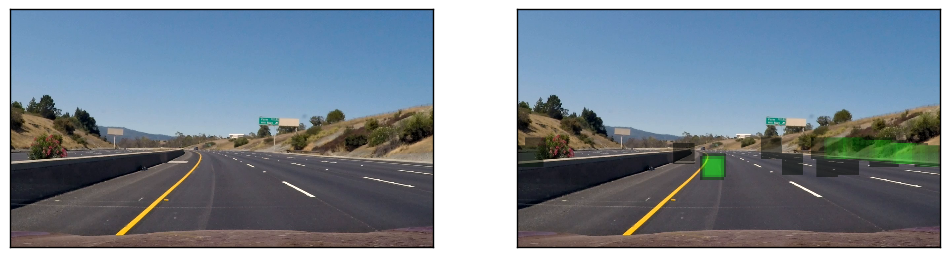

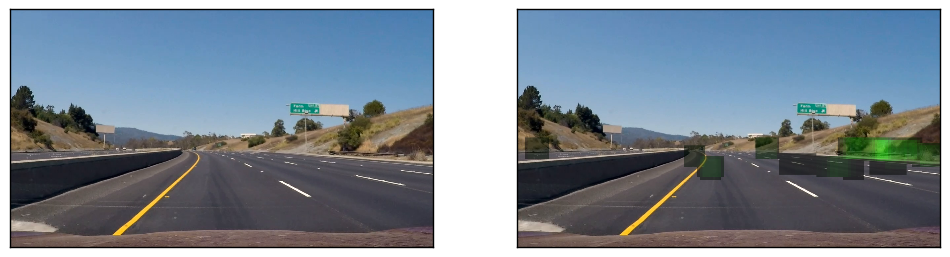

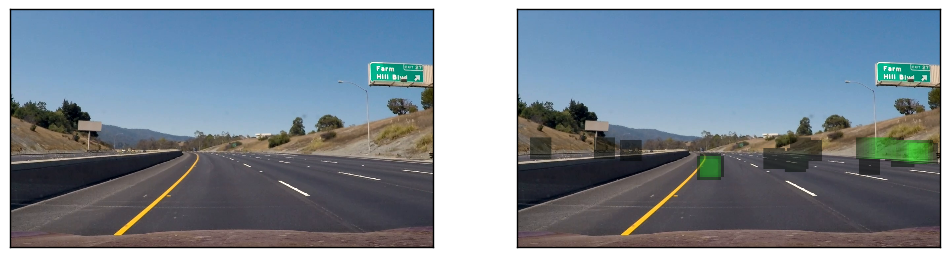

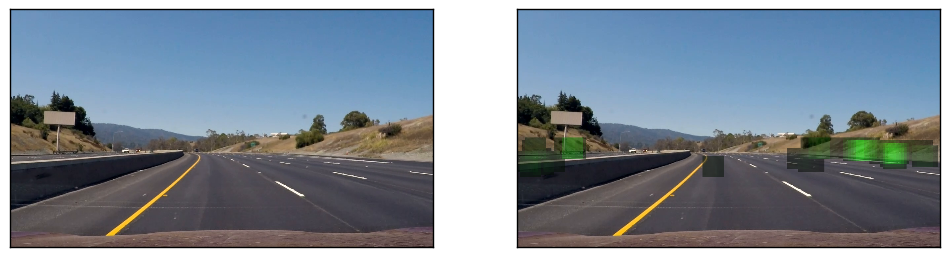

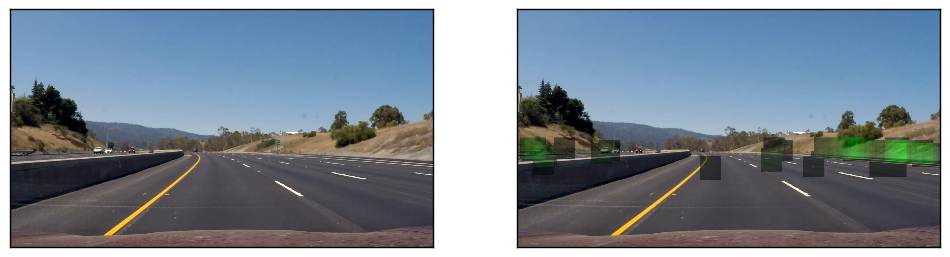

...

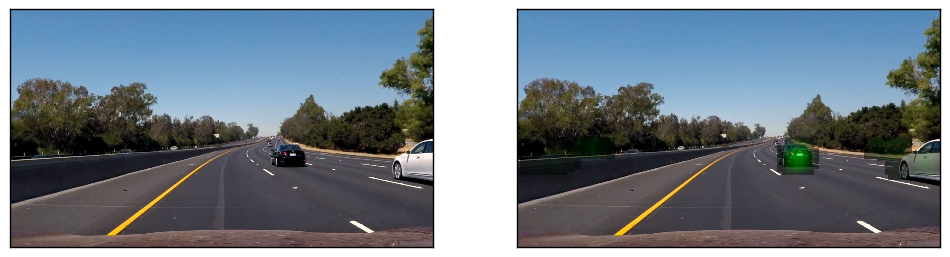

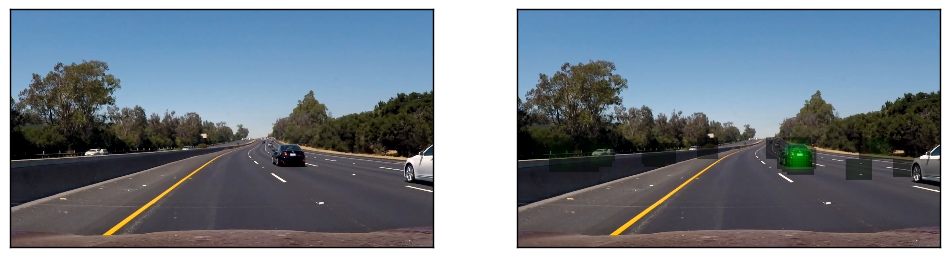

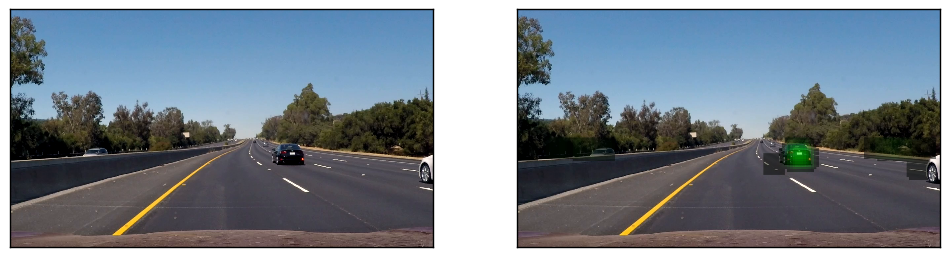

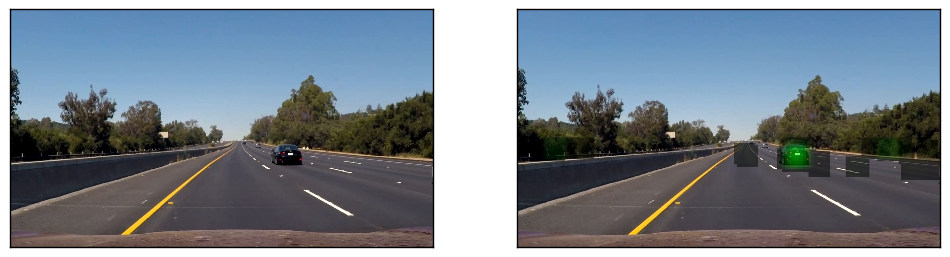

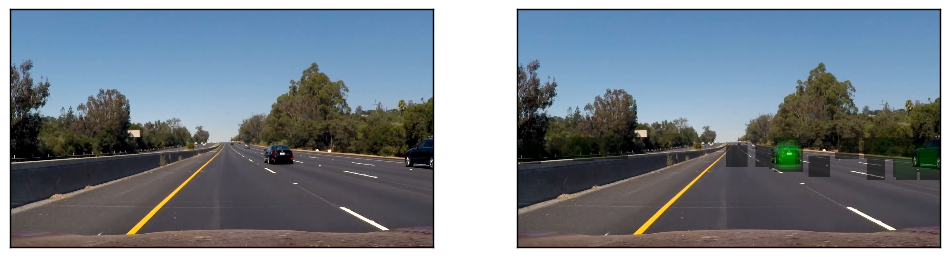

In [12]:
def display_vehicle_annotations():
    shape = (720, 1280)
    y0 = 415
    yn = 655
    identify = Identifier(model, (390, 518, 1.0)) #, (390, 582, 0.75), (390, 655, 0.5))
    for path in find_images('data/project_video_frames/*.png'):
        image = load_image(path, shape)

        mask = np.zeros(image.shape[:2], dtype=np.float32)
        for (a, b, c) in identify(image):
            mask[a:b] += c

        mask = mask * 127.0 / mask.max()
        mask = mask.astype(np.uint8)

        k = (mask > 0)
        mask_bgr = np.zeros_like(image)
        mask_bgr[..., 1] = mask
        annotated = np.copy(image)
        annotated[k] = 0.5 * image[k] + mask_bgr[k]
        annotated = annotated.astype(np.uint8)

        display(image, annotated)

        
display_vehicle_annotations()